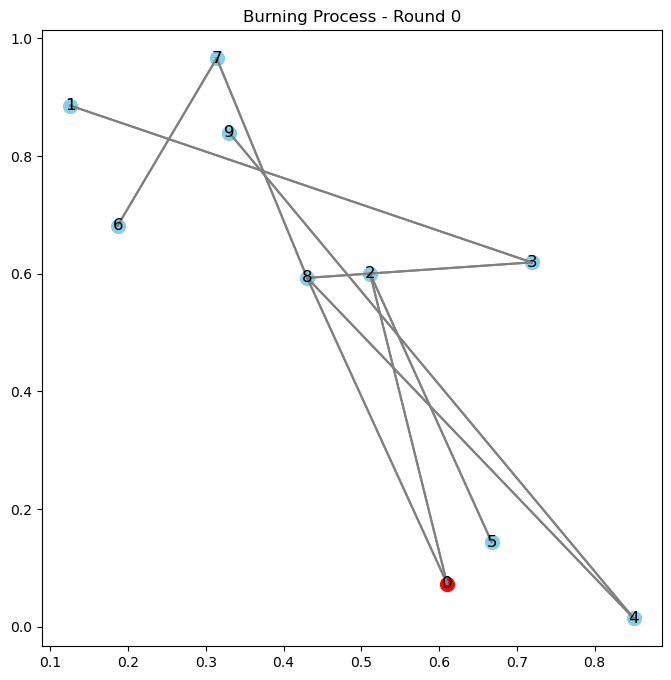

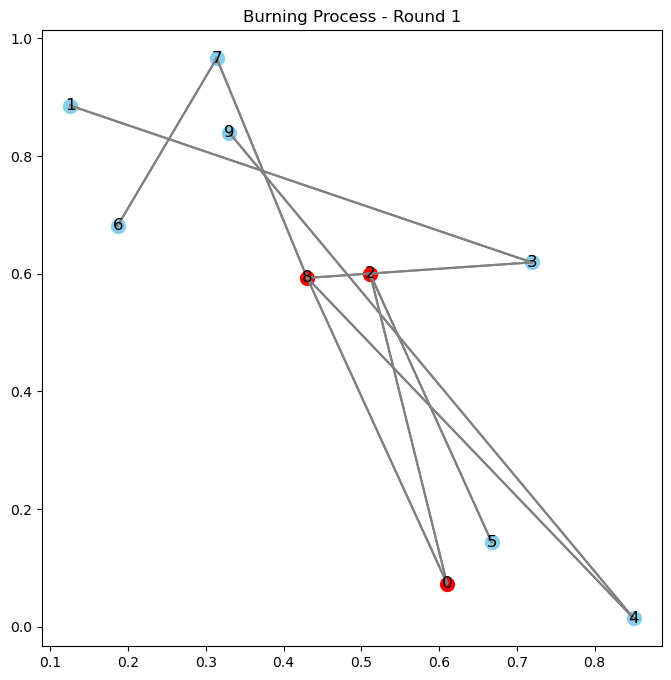

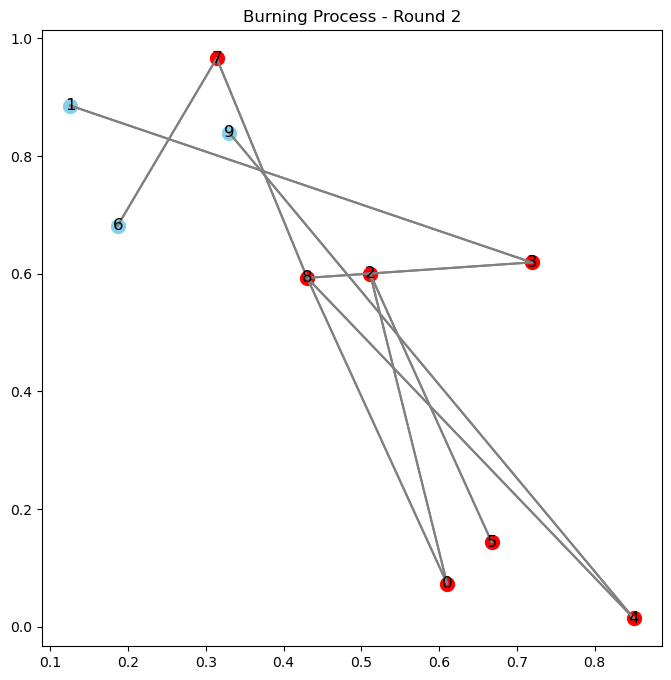

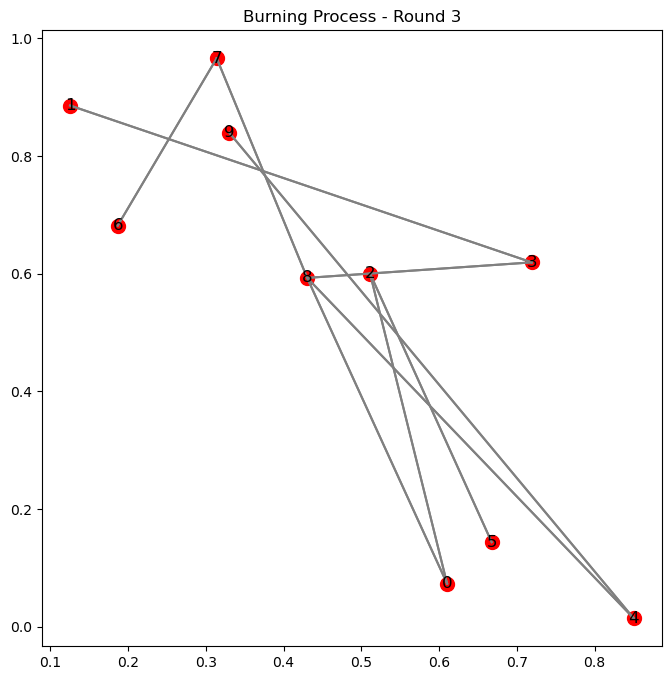

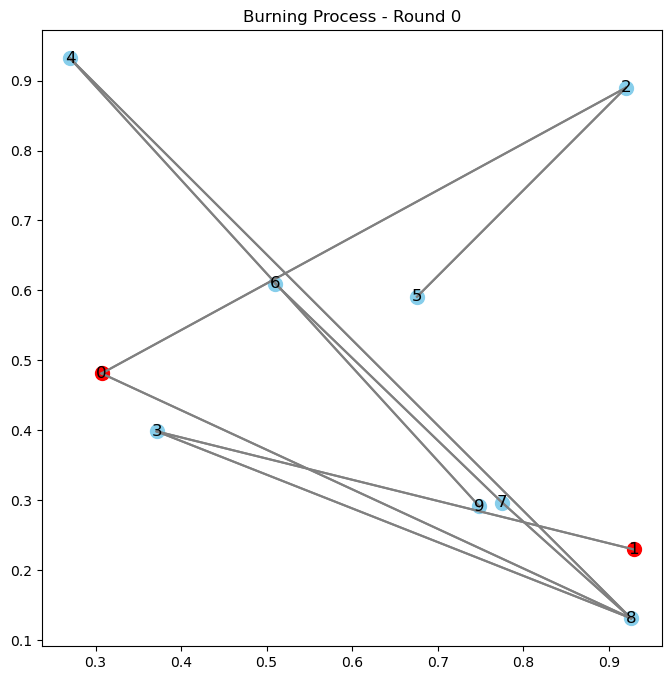

...

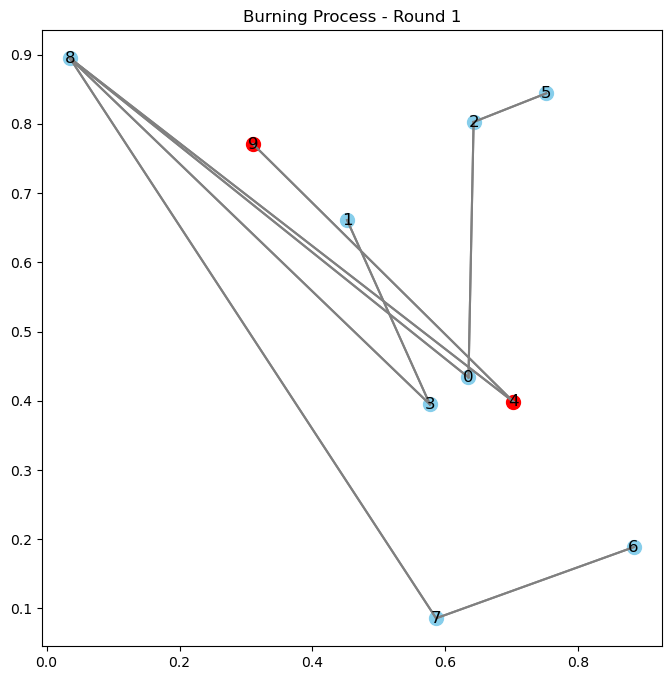

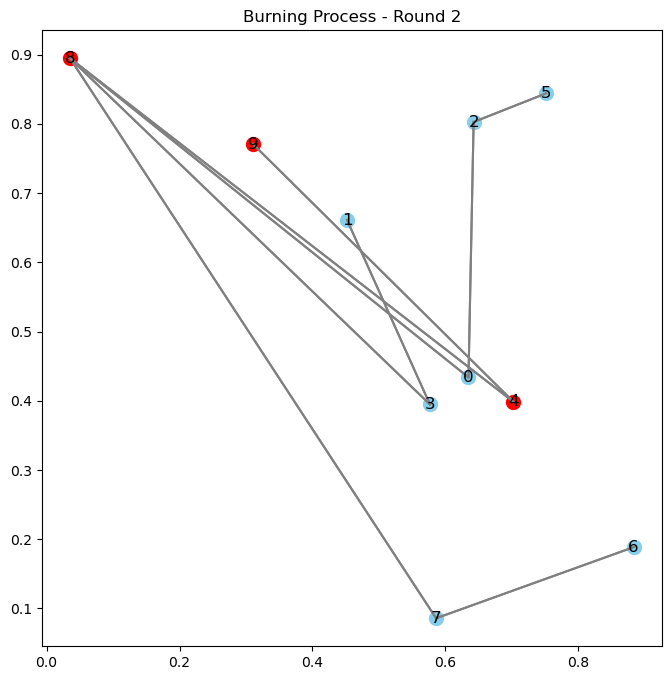

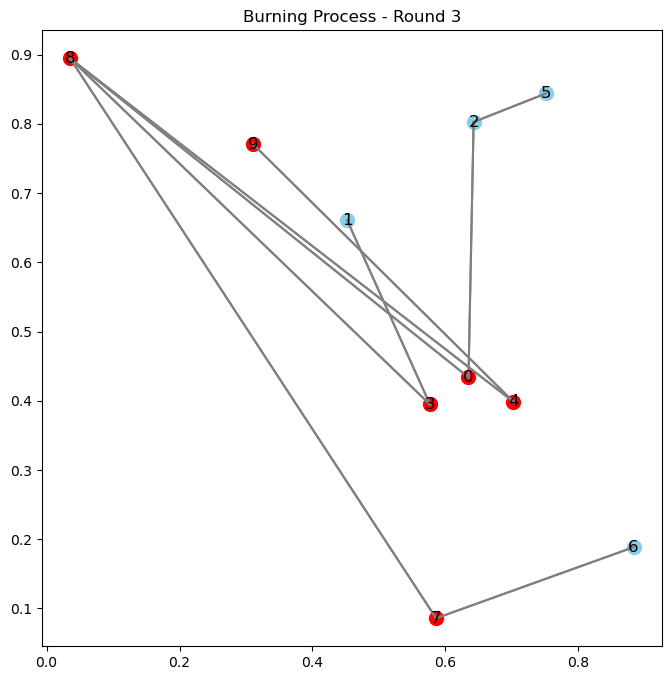

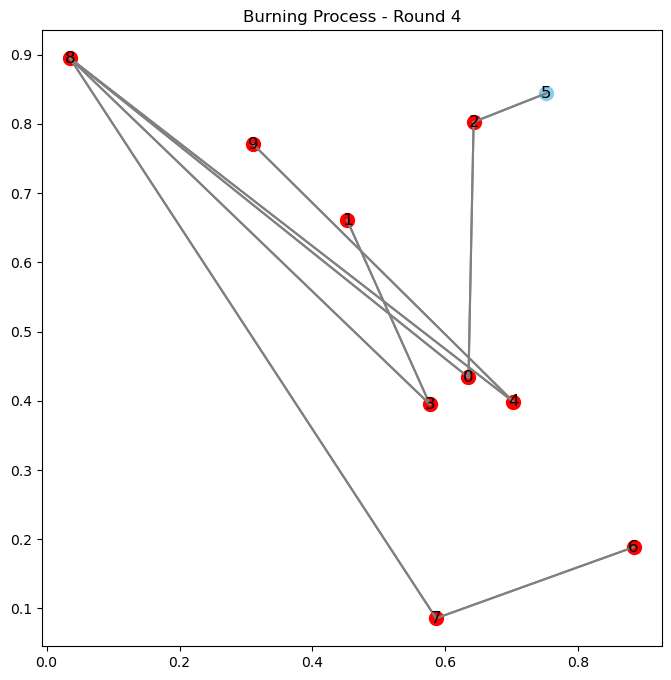

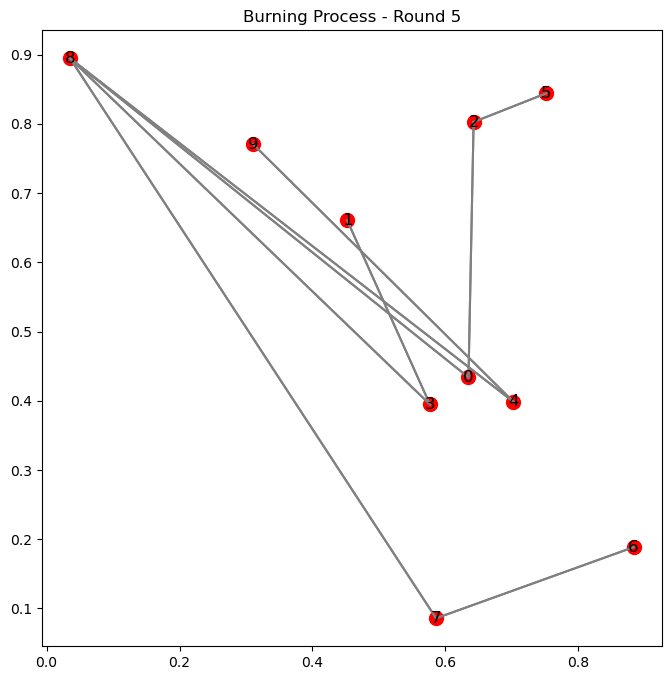

Minimum rounds: 2, Best start nodes: [0, 8]


In [4]:
import matplotlib.pyplot as plt
import random

class Tree:
    def __init__(self, num_nodes):
        self.adj_list = {i: [] for i in range(num_nodes)}
        
    def add_edge(self, u, v):
        self.adj_list[u].append(v)
        self.adj_list[v].append(u)
        
    def neighbors(self, node):
        return self.adj_list[node]
    
    def nodes(self):
        return list(self.adj_list.keys())

def bfs_burn(tree, start_nodes):
    """
    Simulate the burning process on the tree starting from the start_nodes.
    """
    burned = set(start_nodes)
    frontier = set(start_nodes)
    round = 0
    
    pos = {i: (random.uniform(0, 1), random.uniform(0, 1)) for i in tree.nodes()}
    
    while len(burned) < len(tree.nodes()):
        plot_tree(tree, pos, burned, frontier, round)
        next_frontier = set()
        for node in frontier:
            neighbors = set(tree.neighbors(node))
            next_frontier.update(neighbors - burned)
        
        burned.update(next_frontier)
        frontier = next_frontier
        round += 1
        
        if not frontier:
            break
    
    plot_tree(tree, pos, burned, frontier, round)  # Final state
    return round

def find_burning_number(tree):
    """
    Find the burning number of the tree by trying different start nodes combinations.
    """
    min_rounds = float('inf')
    best_start_nodes = []
    
    nodes = tree.nodes()
    n = len(nodes)
    
    for i in range(n):
        for j in range(i, n):
            start_nodes = [nodes[i], nodes[j]]
            rounds = bfs_burn(tree, start_nodes)
            if rounds < min_rounds:
                min_rounds = rounds
                best_start_nodes = start_nodes
    
    return min_rounds, best_start_nodes

def plot_tree(tree, pos, burned, frontier, round):
    plt.figure(figsize=(8, 8))
    for node, neighbors in tree.adj_list.items():
        for neighbor in neighbors:
            x_values = [pos[node][0], pos[neighbor][0]]
            y_values = [pos[node][1], pos[neighbor][1]]
            plt.plot(x_values, y_values, 'gray')
    
    for node in tree.nodes():
        if node in burned:
            color = 'red'
        elif node in frontier:
            color = 'orange'
        else:
            color = 'skyblue'
        plt.scatter(pos[node][0], pos[node][1], c=color, s=100)
        plt.text(pos[node][0], pos[node][1], str(node), fontsize=12, ha='center', va='center')
    
    plt.title(f'Burning Process - Round {round}')
    plt.show()

def generate_random_tree(num_nodes):
    tree = Tree(num_nodes)
    nodes = list(range(num_nodes))
    random.shuffle(nodes)
    for i in range(1, num_nodes):
        tree.add_edge(nodes[i], nodes[random.randint(0, i-1)])
    return tree

# Example usage:
num_nodes = 10

# Create a random tree
tree = generate_random_tree(num_nodes)

rounds, start_nodes = find_burning_number(tree)
print(f"Minimum rounds: {rounds}, Best start nodes: {start_nodes}")
